In [ ]:
import pandas as pd

path = "/Users/macbook/bootcamp-lamoda/data/lamoda_reviews.csv"
df = pd.read_csv(path)
df.head()

,comment_id,product_sku,comment_text,name,good_type,good_subtype
0,395865747,MP002XB078CD,"Купили сыну на день рождения!Теплая, но не жар...",Куртка утепленная,Clothes,OUTWEAR
1,436891792,MP002XB07Z8I,"Приятная вещь, симпатично смотрится",Свитшот,Clothes,SWEATSHIRTS
2,383386833,MP002XC00LSY,Произведено в Турции. Качество хорошее и разме...,Поло,Clothes,TEE-SHIRTS & POLOS
3,400670943,MP002XC01NLE,Классный комплект,Боди и ползунки,Clothes,TEE-SHIRTS & POLOS
4,388822372,MP002XG03J2N,"Отличные перчатки, плотные, яркие. Ребенку 8 л...",Перчатки,Accs,GLOVES & MITTENS


In [ ]:
pd.set_option('display.max_rows', None)

In [ ]:
df.columns

Index(['comment_id', 'product_sku', 'comment_text', 'name', 'good_type',
       'good_subtype'],
      dtype='object')

In [ ]:
import nltk
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import re

# Скачиваем необходимые ресурсы (если нужно)
nltk.download('punkt', quiet=True)
nltk.download('stopwords', quiet=True)

True

In [ ]:
def normalize_text(text):
    if pd.isna(text):
        return ''
    # Приведение к нижнему регистру
    text = str(text).lower()
    # Удаление спецсимволов и цифр
    text = re.sub(r'[^\w\s]', ' ', text)
    text = re.sub(r'\d+', '', text)
    # Удаление лишних пробелов
    text = ' '.join(text.split())
    return text

In [ ]:
# Нормализуем все тексты
df['comment_text_normalized'] = df['comment_text'].apply(normalize_text)

# Токенизация и очистка от стоп-слов
stop_words = set(stopwords.words('russian') + stopwords.words('english'))

In [ ]:
def get_tokens(text):
    tokens = word_tokenize(text, language='russian')
    return [token for token in tokens if token not in stop_words and len(token) > 2]

In [ ]:
all_tokens = []
for text in df['comment_text_normalized']:
    all_tokens.extend(get_tokens(text))

In [ ]:
unigrams = all_tokens
bigrams = [f"{unigrams[i]} {unigrams[i+1]}" for i in range(len(unigrams)-1)]

# Подсчет частотности
unigram_freq = Counter(unigrams).most_common(100)
bigram_freq = Counter(bigrams).most_common(100)

/var/folders/m0/7vmy47yj161c_7jsn81qvj1h0000gn/T/ipykernel_52713/3678105547.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=unigram_df, y='word', x='frequency', palette='viridis')
/var/folders/m0/7vmy47yj161c_7jsn81qvj1h0000gn/T/ipykernel_52713/3678105547.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=bigram_df, y='phrase', x='frequency', palette='magma')


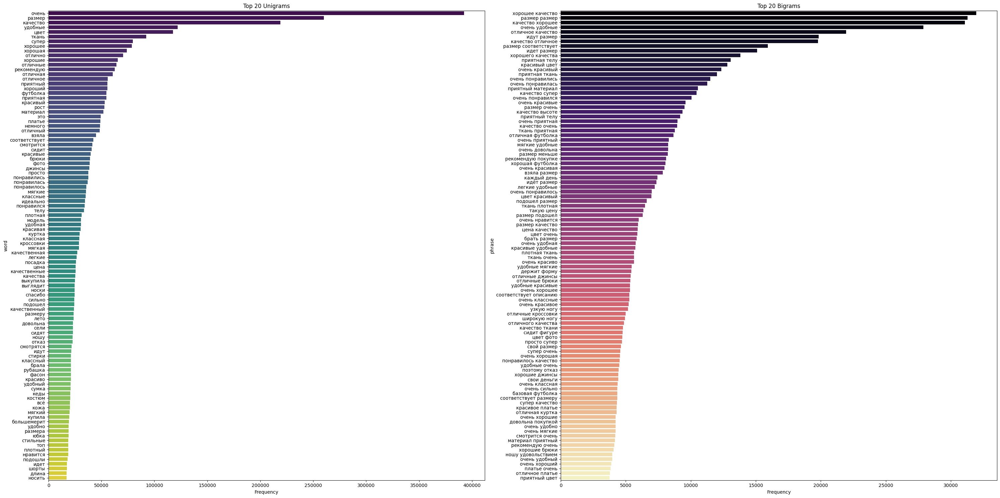

In [ ]:
plt.figure(figsize=(30, 15))

# Униграммы - первая ячейка в сетке 1x2
plt.subplot(1, 2, 1)  # 1 строка, 2 столбца, позиция 1
unigram_df = pd.DataFrame(unigram_freq, columns=['word', 'frequency'])
sns.barplot(data=unigram_df, y='word', x='frequency', palette='viridis')
plt.title('Top 20 Unigrams')
plt.xlabel('Frequency')

# Биграммы - вторая ячейка в сетке 1x2
plt.subplot(1, 2, 2)  # 1 строка, 2 столбца, позиция 2
bigram_df = pd.DataFrame(bigram_freq, columns=['phrase', 'frequency'])
sns.barplot(data=bigram_df, y='phrase', x='frequency', palette='magma')
plt.title('Top 20 Bigrams')
plt.xlabel('Frequency')

plt.tight_layout()
plt.show()

In [ ]:
unigrams_by_subtype = {}
bigrams_by_subtype = {}

for subtype in df['good_subtype'].unique():
    if pd.isna(subtype):
        continue
        
    subtype_data = df[df['good_subtype'] == subtype]
    
    all_tokens = []
    for text in subtype_data['comment_text_normalized']:
        all_tokens.extend(get_tokens(text))
    
    # Создаем униграммы и биграммы
    unigrams = all_tokens
    bigrams = [f"{unigrams[i]} {unigrams[i+1]}" for i in range(len(unigrams)-1)]
    
    # Подсчитываем частотность
    unigrams_by_subtype[subtype] = Counter(unigrams).most_common(30)
    bigrams_by_subtype[subtype] = Counter(bigrams).most_common(30)

# Визуализация униграмм по подтипам
fig, axes = plt.subplots(len(unigrams_by_subtype), 2, figsize=(15, 5*len(unigrams_by_subtype)))

for idx, (subtype, unigram_data) in enumerate(unigrams_by_subtype.items()):
    # Униграммы
    unigram_df = pd.DataFrame(unigram_data, columns=['word', 'frequency'])
    axes[idx, 0].barh(range(len(unigram_df)), unigram_df['frequency'])
    axes[idx, 0].set_yticks(range(len(unigram_df)))
    axes[idx, 0].set_yticklabels(unigram_df['word'])
    axes[idx, 0].set_title(f'{subtype} - Top 30 Unigrams')
    axes[idx, 0].set_xlabel('Frequency')
    
    # Биграммы
    bigram_data = bigrams_by_subtype.get(subtype, [])
    if bigram_data:
        bigram_df = pd.DataFrame(bigram_data, columns=['phrase', 'frequency'])
        axes[idx, 1].barh(range(len(bigram_df)), bigram_df['frequency'])
        axes[idx, 1].set_yticks(range(len(bigram_df)))
        axes[idx, 1].set_yticklabels(bigram_df['phrase'])
        axes[idx, 1].set_title(f'{subtype} - Top 30 Bigrams')
        axes[idx, 1].set_xlabel('Frequency')

plt.tight_layout()
plt.show()

print("Статистика по подтипам:")
print("=" * 50)

for subtype in unigrams_by_subtype:
    print(f"\nПодтип: {subtype}")
    print(f"Количество комментариев: {len(df[df['good_subtype'] == subtype])}")
    
    total_tokens = sum([freq for _, freq in unigrams_by_subtype[subtype]])
    print(f"Общее количество токенов: {total_tokens}")
    
    print("Топ-50 униграмм:")
    for word, freq in unigrams_by_subtype[subtype][:50]:
        print(f"  {word}: {freq}")
    
    if bigrams_by_subtype.get(subtype):
        print("Топ-50 биграмм:")
        for phrase, freq in bigrams_by_subtype[subtype][:50]:
            print(f"  {phrase}: {freq}")
    
    print("-" * 30)

Статистика по подтипам:

Подтип: OUTWEAR
Количество комментариев: 112425
Общее количество токенов: 235572
Топ-50 униграмм:
  очень: 29998
  куртка: 28808
  размер: 20928
  качество: 14576
  цвет: 9915
  хорошая: 9226
  отличная: 8617
  пальто: 7243
  пуховик: 7173
  теплая: 7139
  рост: 6323
  понравилась: 5807
  супер: 5590
  ткань: 5513
  смотрится: 5432
  хорошее: 4926
  отлично: 4910
  классная: 4674
  это: 4319
  теплый: 4251
  сидит: 4241
  отличный: 4162
  большемерит: 4137
  хороший: 4130
  рекомендую: 4112
  легкая: 3963
  красивый: 3908
  удобная: 3888
  отличное: 3839
  взяла: 3824
Топ-50 биграмм:
  отличная куртка: 4245
  хорошая куртка: 3239
  размер размер: 2138
  куртка очень: 2068
  качество хорошее: 2015
  очень понравилась: 1966
  идет размер: 1925
  хорошее качество: 1632
  классная куртка: 1580
  качество отличное: 1439
  куртка хорошая: 1259
  отличное качество: 1168
  отличный пуховик: 1084
  красивый цвет: 1008
  размер меньше: 1004
  куртка отличная: 987
  разме

In [ ]:
df.groupby("good_subtype").count().sort_values("comment_id", ascending=False)

,comment_id,product_sku,comment_text,name,good_type,comment_text_normalized
good_subtype,,,,,,
TEE-SHIRTS & POLOS,170470,170470,170470,170470,170470,170470
SPORT SHOES,162149,162149,162149,162149,162149,162149
TROUSERS & JUMPSUITS,124705,124705,124705,124705,124705,124705
OUTWEAR,112425,112425,112425,112425,112425,112425
UNDERWEAR,90187,90187,90187,90187,90187,90187
KNITWEAR,89738,89738,89738,89738,89738,89738
DRESSES,87521,87521,87521,87521,87521,87521
JEANS,80477,80477,80477,80477,80477,80477
SHIRTS,73908,73908,73908,73908,73908,73908


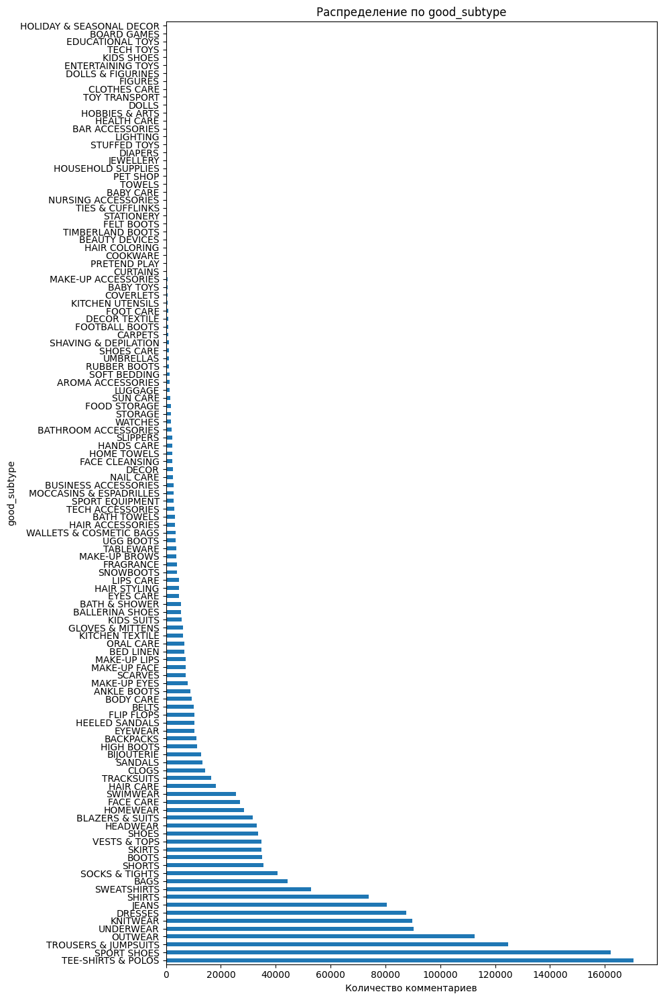

In [ ]:
grouped = df.groupby("good_subtype").count().sort_values("comment_id", ascending=False)

plt.figure(figsize=(10, 15))  # Высота больше ширины
grouped["comment_id"].plot(kind='barh')  # Используем barh вместо bar
plt.title('Распределение по good_subtype')
plt.xlabel('Количество комментариев')
plt.ylabel('good_subtype')
plt.tight_layout()
plt.show()

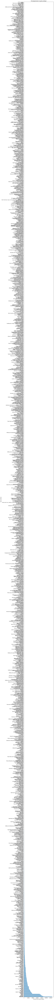

In [ ]:
grouped = df.groupby("name").count().sort_values("comment_id", ascending=False)

plt.figure(figsize=(10, 180))  # Высота больше ширины
grouped["comment_id"].plot(kind='barh')  # Используем barh вместо bar
plt.title('Распределение по good_subtype')
plt.xlabel('Количество комментариев')
plt.ylabel('good_subtype')
plt.tight_layout()
plt.show()

In [ ]:
grouped = df.groupby("name").count().sort_values("comment_id", ascending=False)
grouped_filtered = grouped[grouped["comment_id"]>10000]
print(grouped_filtered.shape)
grouped_filtered.head(100)

(41, 6)


,comment_id,product_sku,comment_text,good_type,good_subtype,comment_text_normalized
name,,,,,,
Футболка,126342,126342,126342,126342,126342,126342
Кроссовки,86497,86497,86497,86497,86497,86497
Джинсы,81256,81256,81256,81256,81256,81256
Платье,77351,77351,77351,77351,77351,77351
Кеды,75286,75286,75286,75286,75286,75286
Брюки,71088,71088,71088,71088,71088,71088
Рубашка,37452,37452,37452,37452,37452,37452
Сумка,35490,35490,35490,35490,35490,35490
Джемпер,33474,33474,33474,33474,33474,33474


In [ ]:
print(grouped_filtered.index.tolist())

['Футболка', 'Кроссовки', 'Джинсы', 'Платье', 'Кеды', 'Брюки', 'Рубашка', 'Сумка', 'Джемпер', 'Брюки спортивные', 'Юбка', 'Ботинки', 'Лонгслив', 'Блуза', 'Туфли', 'Куртка утепленная', 'Пуховик', 'Поло', 'Трусы', 'Бюстгальтер', 'Свитшот', 'Худи', 'Жакет', 'Костюм спортивный', 'Трусы 3 шт.', 'Кардиган', 'Майка', 'Топ', 'Бейсболка', 'Шапка', 'Водолазка', 'Сандалии', 'Пижама', 'Носки 3 пары', 'Сабо', 'Шорты', 'Олимпийка', 'Лоферы', 'Шорты спортивные', 'Сланцы', 'Купальник']


In [ ]:
from openai import OpenAI

client = OpenAI(
  api_key=""
)

In [ ]:
completion = client.chat.completions.create(
  model="gpt-4o-mini",
  store=True,
  messages=[
    {"role": "user", "content": "how are you?"}
  ]
)

print(completion.choices[0].message)

ChatCompletionMessage(content="I'm just a computer program, so I don't have feelings, but I'm here and ready to help you! How can I assist you today?", refusal=None, role='assistant', annotations=[], audio=None, function_call=None, tool_calls=None)


In [ ]:
import os
import json
import re
import time
from pathlib import Path

import pandas as pd
from tqdm.auto import tqdm

/Users/macbook/miniforge3/envs/torch_env/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [ ]:
# ----------------------------
# Настройки
# ----------------------------
N_REVIEWS_PER_NAME = 200          # сколько отзывов брать на один name
MIN_COUNT = 10_000                # твой порог
OUT_JSONL = "name_tags.jsonl"     # append-friendly формат
MODEL = "gpt-4o-mini"

MAX_TAGS = 60
MAX_LEN = 24

In [ ]:
# ----------------------------
# Утилиты
# ----------------------------
def build_prompt(item_name: str, reviews: list[str]) -> str:
    reviews_block = "\n".join(f"- {r}" for r in reviews)

    return f"""
Ты генерируешь короткие summary-теги (которые являются выжимкой из отзывов) для карточки товара на маркетплейсе одежды/обуви/аксессуаров/элементов health_care/.

Объект: name = "{item_name}"

ДАННЫЕ: отзывы покупателей (выборка):
{reviews_block}

СГЕНЕРИРУЙ теги строго по правилам:

1) Верни от 3 до {MAX_TAGS} тегов.
2) Каждый тег — строка на русском, длина тэга <= {MAX_LEN} символов.
3) Теги должны быть полезными и отражать суть отзывов (качество, материал, удобство, посадка/крой без размеров, внешний вид, износ, соответствие фото, и т.д.).
4) НЕ упоминай размер и соответствие размеру. Запрещены любые теги про размер/размерность, включая (но не ограничиваясь):
   - "маломерит", "большемерит", "идет в размер", "размер в размер", "не соответствует размеру",
   - любые формулировки про "размер", "таблица размеров", "S/M/L", "на рост", "на объем", "на стопу" и т.п.
5) Теги не должны противоречить друг другу.
6) Теги внутри одного name не должны дублироваться по смыслу (никаких почти одинаковых перефразов).
7) Формулировки нейтральные, без разговорных слов/эмодзи.
8) Если в отзывах много негатива по конкретному аспекту — можно 1–2 негативных тега, но не больше половины.

ФОРМАТ ОТВЕТА (СТРОГО JSON, без пояснений и без markdown):
{{
  "name": "{item_name}",
  "tags": ["...", "...", "..."]
}}
""".strip()

In [ ]:
def clean_reviews(series: pd.Series) -> list[str]:
    # Минимальная чистка: строки, без пустых, ограничим длину, чтобы не раздувать контекст
    out = []
    for x in series.astype(str).tolist():
        x = re.sub(r"\s+", " ", x).strip()
        if not x:
            continue
        out.append(x[:600])  # обрезаем очень длинные отзывы
    return out


def is_forbidden_size_tag(tag: str) -> bool:
    t = tag.lower()
    forbidden = [
        "маломер", "большемер", "в размер", "идет в размер", "размер", "s/", "m/", "l/", "xl",
        "таблиц", "на рост", "на объем", "на стоп", "cm", "сантим"
    ]
    return any(f in t for f in forbidden)


def postprocess_tags(tags: list[str]) -> list[str]:
    # Удалим пустые, обрежем длину, выкинем размерные, уберём дубли exact (семантические дубли оставим на совести модели)
    seen = set()
    out = []
    for tag in tags or []:
        if not isinstance(tag, str):
            continue
        tag = re.sub(r"\s+", " ", tag).strip()
        if not tag:
            continue
        tag = tag[:MAX_LEN]
        if is_forbidden_size_tag(tag):
            continue
        key = tag.lower()
        if key in seen:
            continue
        seen.add(key)
        out.append(tag)
    return out[:MAX_TAGS]


def call_llm_for_tags(client, item_name: str, reviews: list[str], max_retries: int = 3) -> dict:
    prompt = build_prompt(item_name, reviews)

    last_err = None
    for attempt in range(1, max_retries + 1):
        try:
            resp = client.chat.completions.create(
                model=MODEL,
                messages=[{"role": "user", "content": prompt}],
                temperature=0.3,
            )

            text = resp.choices[0].message.content.strip()

            data = json.loads(text)  # просим STRICT JSON, поэтому просто парсим
            # Валидация структуры
            if not isinstance(data, dict) or "tags" not in data:
                raise ValueError("Bad JSON schema: expected dict with 'tags'")

            tags = postprocess_tags(data.get("tags", []))
            result = {"name": item_name, "tags": tags}
            return result

        except Exception as e:
            last_err = e
            # небольшая пауза + ретрай
            time.sleep(1.0 * attempt)

    # если совсем не вышло — вернём пустое, но зафиксируем
    return {"name": item_name, "tags": [], "error": str(last_err)}


def append_jsonl(path: str, obj: dict):
    with open(path, "a", encoding="utf-8") as f:
        f.write(json.dumps(obj, ensure_ascii=False) + "\n")


def load_done_names(jsonl_path: str) -> set[str]:
    done = set()
    if not Path(jsonl_path).exists():
        return done
    with open(jsonl_path, "r", encoding="utf-8") as f:
        for line in f:
            line = line.strip()
            if not line:
                continue
            try:
                obj = json.loads(line)
                if isinstance(obj, dict) and "name" in obj:
                    done.add(obj["name"])
            except Exception:
                continue
    return done


# ----------------------------
# Основной цикл
# ----------------------------
def generate_tags_db(df: pd.DataFrame, client):
    # 1) сортировка name по частоте, фильтр > MIN_COUNT
    grouped = df.groupby("name")["comment_id"].count().sort_values(ascending=False)
    names = grouped[grouped > MIN_COUNT].index.tolist()

    # 2) чтобы можно было запускать повторно и не перегенерить уже готовые
    done = load_done_names(OUT_JSONL)

    results = []
    for item_name in tqdm(names, desc="Generating tags by name"):
        if item_name in done:
            continue

        # 3) берём n отзывов по name
        sub = df.loc[df["name"] == item_name, "comment_text"].dropna()

        # можно рандомизировать выборку, чтобы не брать всегда первые
        sub = sub.sample(n=min(N_REVIEWS_PER_NAME, len(sub)), random_state=42)

        reviews = clean_reviews(sub)
        if not reviews:
            obj = {"name": item_name, "tags": []}
            append_jsonl(OUT_JSONL, obj)
            results.append(obj)
            continue

        # 4) запрос к модели
        obj = call_llm_for_tags(client, item_name, reviews)

        # 5) append в jsonl + в память
        append_jsonl(OUT_JSONL, obj)
        results.append(obj)

    return results

In [ ]:
df_small = df[df['name']=='Футболка']
df_small.groupby("name")["comment_id"].count().sort_values(ascending=False).head(10)

name
Футболка    126342
Name: comment_id, dtype: int64

In [ ]:
results = generate_tags_db(df_small, client)
print(results[:3])

Generating tags by name: 100%|██████████| 1/1 [00:05<00:00,  5.99s/it]

[{'name': 'Футболка', 'tags': ['яркая', 'стильная', 'мягкая', 'приятная', 'плотная', 'хорошее качество', 'базовая модель', 'удобная', 'комфортная', 'классный принт', 'акцентный цвет', 'не просвечивает', 'хлопковая', 'долговечная', 'не деформируется', 'легкая', 'ткань дышащая', 'оригинальный дизайн', 'крой свободный', 'подходит для повседневно', 'хороший пошив', 'небольшой брак', 'тонкая', 'быстро теряет форму', 'неприятный запах', 'красивый цвет', 'нежная ткань', 'классное качество']}]
